# This colab notebook runs the face and the age-gender models.

Since colab does not support docker, we have to run them one by one.

There are two repos used here. One is the [face-detection-recognition](https://github.com/tae898/face-detection-recognition.git) and the other is [age-gender](https://github.com/tae898/age-gender.git).

If you encounter a problem, run `Runtime` -> `Factory reset runtime` and run the cells from the beginning.



## Clone the two repos, and install them.

In [ ]:
%%bash
git clone https://github.com/tae898/face-detection-recognition.git
cd face-detection-recognition
wget https://github.com/tae898/face-detection-recognition/releases/download/models/models.zip

unzip models.zip

mkdir -p ~/.insightface/
mv models ~/.insightface/

pip install -r requirements.txt
cd python-package && pip install . && cd ..

cd ..
git clone https://github.com/tae898/age-gender.git
cd age-gender
#pip3 install -r requirements.txt

# remove the annotated images and pickle files cuz we want to get them manually later.
rm test-images/*ANNOTATED*
rm test-images/*.pkl
rm test-images/*

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
%%bash
cp -a /content/gdrive/MyDrive/images-gender-classification/. /content/age-gender/test-images/

## Pip Install Libraries

In [ ]:
pip install Flask==2.0.1

In [ ]:
pip install jsonpickle==2.0.0

In [ ]:
pip install Pillow==8.3.1

In [ ]:
pip install scipy

In [ ]:
pip install torch

In [ ]:
pip install tqdm==4.61.2

In [ ]:
pip install Werkzeug==2.2.2

## Run the two flask API services.

In [ ]:
%cd face-detection-recognition/
import subprocess

subprocess.Popen(["python3", "app.py", "--gpu-id", "-1"])

%cd  ../age-gender
subprocess.Popen(["python3", "app.py"])

import time

time.sleep(10)

## Run inference on the test images

In [ ]:
%%bash
ls test-images/* | wc -l

In [ ]:
%%bash
lscpu

In [ ]:
%%time
%%bash
for filename in test-images/*; do
    python client.py --image-path $filename
done

## Check if the results are saved properly

In [15]:
!ls test-images/

demo_age_and_gender.ipynb      ins_104.png.ANNOTATED.jpg
ins_101.png		       ins_104.png.ANNOTATED.jpg.pkl
ins_101.png.ANNOTATED.jpg      ins_105.png
ins_101.png.ANNOTATED.jpg.pkl  ins_105.png.ANNOTATED.jpg
ins_102.png		       ins_105.png.ANNOTATED.jpg.pkl
ins_102.png.ANNOTATED.jpg      ins_259.png
ins_102.png.ANNOTATED.jpg.pkl  ins_259.png.ANNOTATED.jpg
ins_103.png		       ins_259.png.ANNOTATED.jpg.pkl
ins_103.png.ANNOTATED.jpg      President_Barack_Obama.jpg
ins_103.png.ANNOTATED.jpg.pkl  President_Barack_Obama.jpg.ANNOTATED.jpg
ins_104.png		       President_Barack_Obama.jpg.ANNOTATED.jpg.pkl


## Let's visualize the annotaed images!

##**CAUTION: Before you run the below cells, you have to run `Runtime` -> `Restart runtime`**

[Errno 2] No such file or directory: 'age-gender'
/content/age-gender


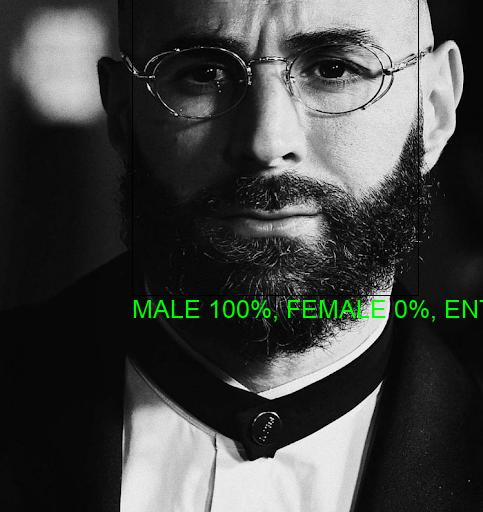

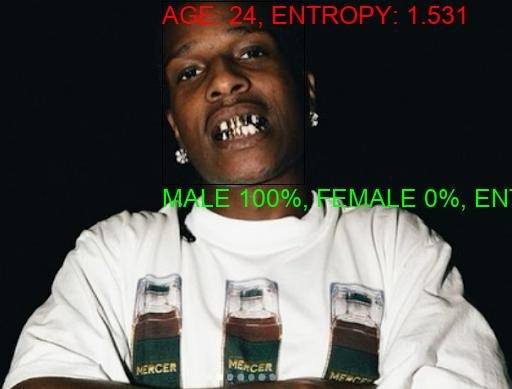

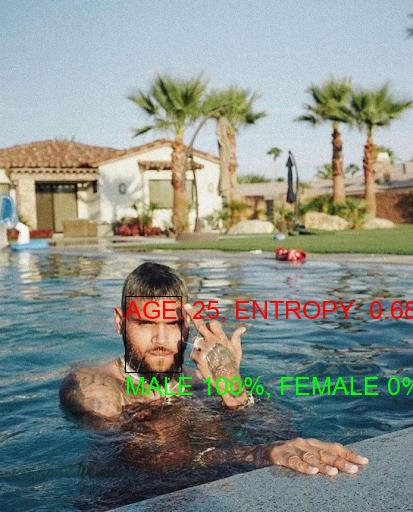

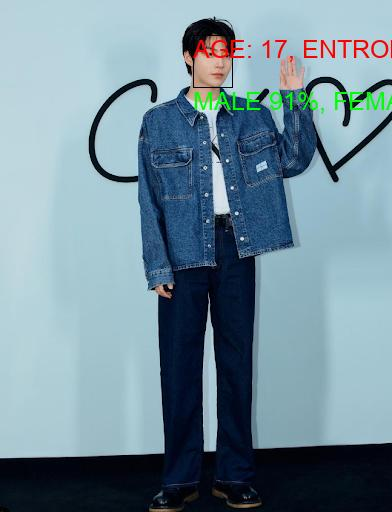

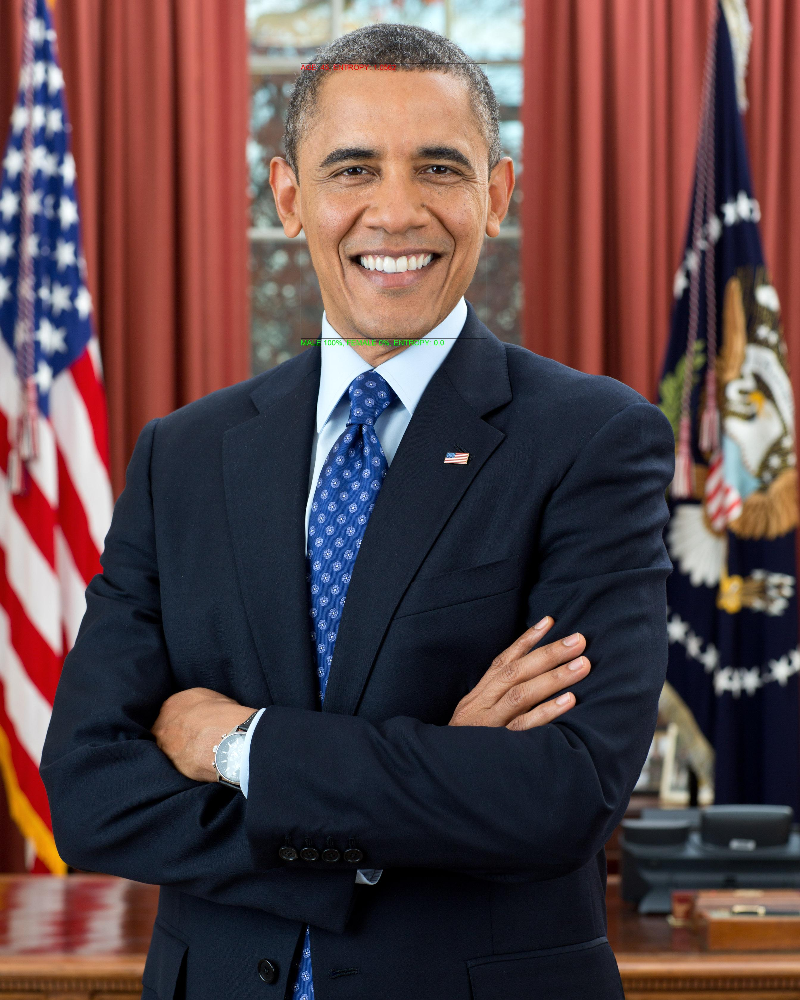

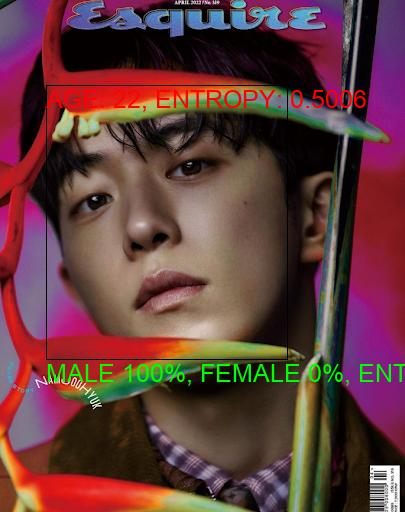

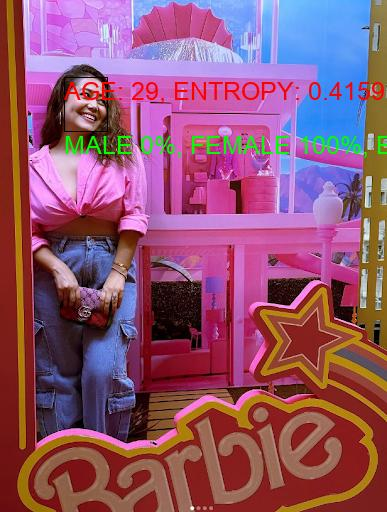

In [16]:
%cd age-gender
from PIL import Image
from glob import glob

for image_path in glob("./test-images/*ANNOTATED.jpg"):
    image = Image.open(image_path)
    display(image)

## The bounding boxes, detection scores, landmarks, face-embeddings, genders, and ages are displayed in the Data frame

In [ ]:
import pickle as pkl
import pandas as pd
import os
df_concat = pd.DataFrame()
for pickle_path in glob("./test-images/*.pkl"):
    with open(pickle_path, "rb") as stream:
      object = pkl.load(stream)
      df = pd.DataFrame(object)
      df['Image name'] = os.path.basename(pickle_path).strip("png.ANNOTATED.jpg.pkl")
      df_concat = pd.concat([df_concat, df])


df_concat['gender predicted'] = 'Male'
for i in range(len(df_concat)):
  if df_concat['genders'].iloc[i]['m'] >= 0.5:
    df_concat['gender predicted'].iloc[i] = "Male"
  else:
    df_concat['gender predicted'].iloc[i] = "Female"

df_concat.index = range(len(df_concat))

In [32]:
df_concat

,bboxes,det_scores,landmarks,embeddings,genders,ages,Image name,gender predicted
0,"[46.76312866210938, 85.03775634765626, 287.898...",0.999680,"[[90.1697021484375, 196.12628173828125], [192....","[-0.001957192, -0.09198082, 0.010052776, -0.13...","{'m': 1.0, 'f': 0.0, 'entropy': 0.0}","{'mean': 22.2734375, 'entropy': 0.500599849480...",ins_103,Male
1,"[64.91351318359375, 77.33712158203126, 107.528...",0.997404,"[[84.08118896484376, 95.45283203125001], [102....","[0.0187585, -0.009006657, 0.02115392, 0.020975...","{'m': 0.0, 'f': 1.0, 'entropy': 0.0}","{'mean': 29.16796875, 'entropy': 0.41594185455...",ins_102,Female
2,"[125.90838623046875, 296.56083984375, 181.5010...",0.999242,"[[146.51873779296875, 324.933251953125], [170....","[0.019480512, -0.023036897, -0.014674051, -0.0...","{'m': 1.0, 'f': 0.0, 'entropy': 0.0}","{'mean': 25.44140625, 'entropy': 0.68767064612...",ins_104,Male
3,"[132.54287109375, -73.76195678710938, 418.0758...",0.999136,"[[201.477783203125, 79.05828857421875], [335.1...","[0.082824044, 0.05761855, -0.027504062, -0.018...","{'m': 1.0, 'f': 0.0, 'entropy': 0.0}","{'mean': 43.0, 'entropy': 0.0}",ins_101,Male
4,"[162.8511962890625, 1.4207397460937514, 304.10...",0.999592,"[[188.585302734375, 74.753076171875], [253.186...","[0.024478238, -0.05234526, -0.002554529, -0.03...","{'m': 1.0, 'f': 0.0, 'entropy': 0.0}","{'mean': 23.951171875, 'entropy': 1.5310280857...",ins_259,Male
5,"[1010.8185642242433, 212.24109330177308, 1635....",0.999395,"[[1182.1513103485108, 580.7828387260438], [147...","[0.047310386, -0.03320125, -0.05764345, 0.0348...","{'m': 1.0, 'f': 0.0, 'entropy': 0.0}","{'mean': 45.3046875, 'entropy': 1.056209516828...",President_Barack_Obama,Male
6,"[193.6983642578125, 35.098959350585936, 232.36...",0.993073,"[[209.75478515625002, 54.74791259765625], [226...","[0.0010568504, -0.0814577, -0.060268562, -0.01...","{'m': 0.90625, 'f': 0.09375, 'entropy': 0.3111...","{'mean': 17.359375, 'entropy': 0.2781811147738...",ins_105,Male


In [33]:
df_concat.to_csv('/content/gdrive/MyDrive/images-gender-classification/results.csv')